In [1]:
import pandas as pd
import numpy as np
import pickle
import os

import torch
import warnings
warnings.filterwarnings("ignore")
torch.__version__

pd.set_option('display.max_rows', 200)

In [28]:
DATAPATH = '/root/autodl-tmp'
TARGET = 'occasion_cn'

data = pd.read_csv(os.path.join(DATAPATH, '150M_training_data.csv'))[['id', TARGET]]

print(data.shape)

(1532268, 2)


In [3]:
# cnt = data[TARGET].value_counts(normalize = True)

# data = data[data[TARGET].isin(cnt[cnt>0.00005].index)]

# data[TARGET].nunique()

54

In [29]:
embedings = {}
for filename in os.listdir('/root/Pepsi/data/qwen2_05B_embeddings'):
  with open(f'/root/Pepsi/data/qwen2_05B_embeddings/{filename}', 'rb') as f:
    embedings.update(pickle.load(f))

In [30]:
data['embed'] = data['id'].apply(lambda x: embedings[x])
del embedings

In [31]:
# pd.DataFrame([data[TARGET].value_counts(normalize = True), data[TARGET].value_counts()]).T.to_csv('tmp.csv')

In [45]:
DATA_SIZE = 200000 
TRAIN_TEST_RATIO = 0.15
SEED = 3075


from sklearn.model_selection import train_test_split

if DATA_SIZE:
    train = data.sample(DATA_SIZE, random_state = SEED)
else:
    train = data

lost_targets = set(data[TARGET].unique()).difference(train[TARGET].unique())

lost_data = data[data[TARGET].isin(lost_targets)]

train = pd.concat([train, lost_data], axis = 0)



cnt = train[TARGET].value_counts()
train_less_than_2 = train[train[TARGET].isin(cnt[cnt<=2].index)]
train = train[train[TARGET].isin(cnt[cnt>2].index)]

train, test = train_test_split(train, stratify = train[TARGET], test_size = TRAIN_TEST_RATIO, random_state = SEED, shuffle = True)
train, val = train_test_split(train, stratify = train[TARGET], test_size = TRAIN_TEST_RATIO, random_state = SEED, shuffle = True)

val = pd.concat([val, train_less_than_2], axis = 0)
train = pd.concat([train, train_less_than_2], axis = 0)


display(
        pd.DataFrame([
            train[TARGET].value_counts(normalize = True),
            train[TARGET].value_counts(),
        ]).T
    )

,proportion,count
occasion_cn,,
一人食光,0.194361,28114.0
一个人的屏幕时光,0.184095,26629.0
家庭聚会,0.151029,21846.0
家庭庆祝,0.086866,12565.0
宅家创意时刻,0.070495,10197.0
家庭日常,0.064170,9282.0
充能早餐,0.061114,8840.0
办公室派对,0.047059,6807.0
Others,0.037173,5377.0


In [46]:
train_X = train['embed'].values.tolist()
train_X = np.array(train_X)
train_y = train[TARGET].values

val_X = val['embed'].values.tolist()
val_X = np.array(val_X)
val_y = val[TARGET].values

test_X = test['embed'].values.tolist()
test_X = np.array(test_X)
test_y = test[TARGET].values

In [47]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
label_encoder = OneHotEncoder(sparse_output=False)
train_encoded_y = label_encoder.fit_transform(train_y.reshape(-1,1))
val_encoded_y = label_encoder.transform(val_y.reshape(-1,1))
test_encoded_y = label_encoder.transform(test_y.reshape(-1,1))

In [48]:
INPUT_SHAPE = train_X[0].shape[0]


OUTPUT_SIZE = pd.Series(train_y).nunique()

print(INPUT_SHAPE, OUTPUT_SIZE)

896 151


In [49]:
# import tensorflow as tf
# from tensorflow import keras
# from tensorflow.keras import Sequential, Model, layers

# train_dataset = tf.data.Dataset.from_tensor_slices((train_X, train_encoded_y))
# val_dataset = tf.data.Dataset.from_tensor_slices((val_X, val_encoded_y))
# test_dataset = tf.data.Dataset.from_tensor_slices((test_X, test_encoded_y))

In [50]:
from tensorflow.keras import Sequential, Model, layers
import tensorflow as tf

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
@keras.saving.register_keras_serializable()
class MySequentialModel(tf.keras.Model):
  def __init__(self, name=None, **kwargs):
    super().__init__(**kwargs)

    self.input = layers.Input(shape = (INPUT_SHAPE)),
    self.dense_1 = layers.Dense(INPUT_SHAPE, activation = 'linear', name = 'ffn1'),
    self.dropout_1 = layers.Dropout(.5),
    self.layernorm_1 = layers.LayerNormalization(),
        # # layers.Dense(768, activation = 'relu'),
        # # layers.Dropout(.5, name = 'dropout1'),
        # layers.LayerNormalization(name = 'layernorm1'),
        # layers.Dense(64, activation = 'relu'),
    self.add1 = layers.Add()
    self.final = layers.Dense(OUTPUT_SIZE, activation = 'softmax', name = 'classification_header')
  def call(self, x):
    x = self.input(x)
    x_ = self.dense_1(x)
    x_ = self.dropout_1(x_)
    x_ = self.layernorm_1(x_)
    x = self.add(x,x_)
    return self.dense_2(x)

model = MySequentialModel()
model.compile(
    loss = 'categorical_crossentropy', optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy']
)
model.summary()

In [53]:
model = Sequential(
    [
        layers.Input(shape = (INPUT_SHAPE)),
        layers.Dense(INPUT_SHAPE, activation = 'linear', name = 'ffn1'),
        layers.Dropout(.5),
        layers.LayerNormalization(),
        # layers.Dense(768, activation = 'relu'),
        # layers.Dropout(.5, name = 'dropout1'),
        layers.LayerNormalization(name = 'layernorm1'),
        layers.Dense(64, activation = 'relu'),
        # layers.Dropout(.5),
        layers.Dense(OUTPUT_SIZE, activation = 'softmax', name = 'classification_header')
    ]
)

model.compile(
    loss = 'categorical_crossentropy', optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy']
             
             )
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ffn1 (Dense)                (None, 896)               803712    
                                                                 
 dropout_1 (Dropout)         (None, 896)               0         
                                                                 
 layer_normalization (LayerN  (None, 896)              1792      
 ormalization)                                                   
                                                                 
 classification_header (Dens  (None, 151)              135447    
 e)                                                              
                                                                 
Total params: 940,951
Trainable params: 940,951
Non-trainable params: 0
_________________________________________________________________


In [54]:
from datetime import datetime as dt 

os.makedir(f'{DATAPATH}/{TARGET}', exist_ok = True)

timestamp = dt.now().strftime("%Y%m%d%H%M%S")


with open(f'{DATAPATH}/{TARGET}/{timestamp}-label_encoder.pkl', 'w') f:
    pickle.dump(label_encoder, f)

tf.random.set_seed(3407)

history = model.fit(
    train_X, train_encoded_y, epochs = 2000,
    batch_size = 64,
    validation_data = (val_X, val_encoded_y),
    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience= 300),
        tf.keras.callbacks.ModelCheckpoint(f'{DATAPATH}/{TARGET}/{timestamp}', save_best_only=True),
        tf.keras.callbacks.TensorBoard(log_dir=f'/root/tf-logs/{TARGET}/{timestamp}/', histogram_freq=1)
        #TestCallback(test_dataset.batch(64), None)
    ],
    # class_weight = class_weight
)

Epoch 1/2000


2024-06-25 15:36:51.906765: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8700


2261/2261 [==============================] - 14s 5ms/step - loss: 1.8100 - accuracy: 0.4297 - val_loss: 1.7316 - val_accuracy: 0.4711
Epoch 2/2000
2261/2261 [==============================] - 11s 5ms/step - loss: 1.6225 - accuracy: 0.4730 - val_loss: 1.6484 - val_accuracy: 0.4933
Epoch 3/2000
2261/2261 [==============================] - 11s 5ms/step - loss: 1.5753 - accuracy: 0.4847 - val_loss: 1.5862 - val_accuracy: 0.5009
Epoch 4/2000
2261/2261 [==============================] - 11s 5ms/step - loss: 1.5446 - accuracy: 0.4921 - val_loss: 1.5759 - val_accuracy: 0.4993
Epoch 5/2000
2261/2261 [==============================] - 11s 5ms/step - loss: 1.5239 - accuracy: 0.4976 - val_loss: 1.5700 - val_accuracy: 0.5048
Epoch 6/2000
2261/2261 [==============================] - 10s 4ms/step - loss: 1.5076 - accuracy: 0.5014 - val_loss: 1.6178 - val_accuracy: 0.5012
Epoch 7/2000
2261/2261 [==============================] - 11s 5ms/step - loss: 1.4952 - accuracy: 0.5055 - val_loss: 1.5458 - val_a

KeyboardInterrupt: 

In [ ]:
model.save(f'{DATAPsATH}/{TARGET}/{timestamp}_final')

In [57]:
test_y

array(['一个人的屏幕时光', '家庭聚会', '一人食光', ..., '家庭聚会', '家庭聚会', '家庭庆祝'],
      dtype=object)

In [58]:
model = tf.keras.models.load_model(f'{DATAPATH}/{TARGET}/{timestamp}')
model.evaluate(test_X, test_encoded_y)



938/938 [==============================] - 3s 3ms/step - loss: 1.4755 - accuracy: 0.5245


[1.4754691123962402, 0.52447110414505]

In [59]:
test_y_pred = model.predict(test_X)
# test_y_pred = tf.one_hot(test_y_pred, 30)
test_y_pred = label_encoder.inverse_transform(test_y_pred).reshape(1,-1)[0]

938/938 [==============================] - 2s 2ms/step


In [ ]:
import matplotlib.font_manager as fm
font_path = 'STHeitiTC-Medium.ttf'

import matplotlib
import matplotlib.font_managerssssss
# matplotlib.font_manager._rebuild()
my_font = fm.FontProperties(fname=font_path)
matplotlib.rcParams['font.family'] = ['Heiti TC']


from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

cm = confusion_matrix(test_y, test_y_pred)
a = ConfusionMatrixDisplay(cm/cm.sum(axis=0))
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize = (36,30))
a.display_labels = [i for i in list(map(lambda x: x[3:] , label_encoder.get_feature_names_out())) if i in test_y]
a.plot(cmap= 'Blues', colorbar=False, ax = ax, values_format = '.2f' ,text_kw = dict(color = 'white', size = 8))
ax.tick_params(axis='x', labelrotation=90)

In [67]:
(
    pd.DataFrame({'index':test_y_pred, 'acc':test_y == test_y_pred}).groupby('index').mean()
    .join(pd.DataFrame({'index':test_y, 'target count':test_y == test_y_pred}).groupby('index').count(), how = 'outer')
    .join(pd.DataFrame({'index':test_y_pred, 'prediction count': test_y_pred}).groupby('index').count(), how = 'outer')
    .join(pd.DataFrame({'index':test_y_pred, 'prediction true': (test_y == test_y_pred).astype(int)}).groupby('index').sum(), how = 'outer')
    .sort_values('target count', ascending = False)

)

,acc,target count,prediction count,prediction true
index,,,,
一人食光,0.504286,5837,6649.0,3353.0
一个人的屏幕时光,0.561449,5529,4638.0,2604.0
家庭聚会,0.526326,4536,5147.0,2709.0
家庭庆祝,0.683327,2609,2741.0,1873.0
宅家创意时刻,0.573781,2117,1518.0,871.0
家庭日常,0.390199,1927,2714.0,1059.0
充能早餐,0.645065,1835,2006.0,1294.0
办公室派对,0.594473,1413,1556.0,925.0
Others,0.464455,1116,422.0,196.0


In [70]:
m = tf.keras.metrics.TopKCategoricalAccuracy(k=5)
m.update_state(label_encoder.transform(test_y.reshape(-1,1)),
               model.predict(test_X))
m.result()

938/938 [==============================] - 2s 2ms/step


<tf.Tensor: shape=(), dtype=float32, numpy=0.9138098>

In [ ]:
test_rst = pd.DataFrame({'id': data[data['data_type'] == 'test']['id'].values, 'content': data[data['data_type'] == 'test']['content'].values,'true': test_y,'pred':test_y_pred, 'acc':test_y == test_y_pred})
test_rst_wrong = test_rst[~test_rst['acc']]

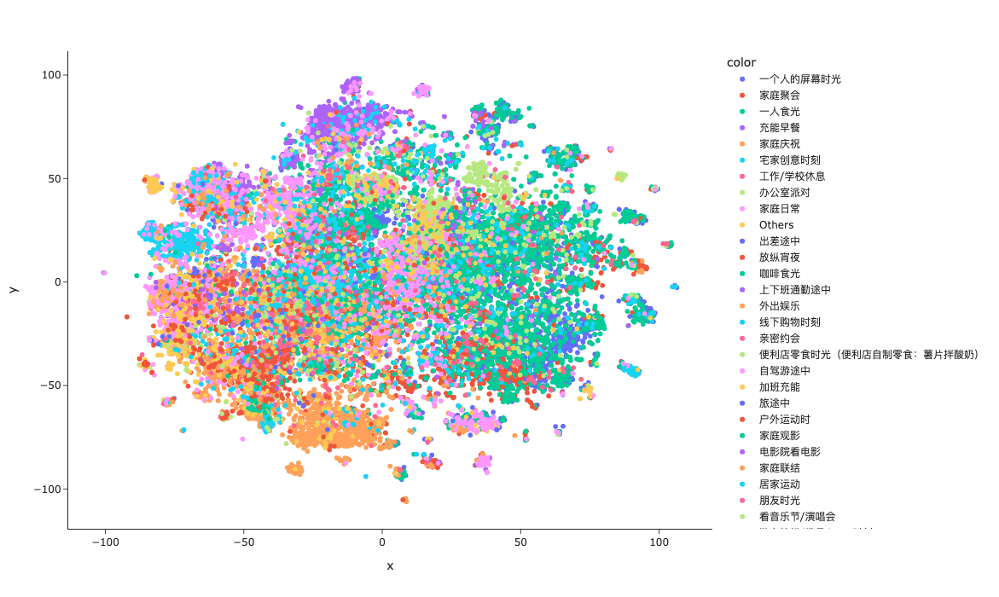

In [78]:
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# pca = PCA(n_components=2)
# x_pca = pca.fit_transform(embedings)
# embedding_layers = tf.keras.Sequential(model.layers[:-1])
# test_embedings = embedding_layers(test_X)
# tsne = TSNE(n_components=2, learning_rate='auto',init='random', perplexity=30)
# x_pca = tsne.fit_transform(test_embedings)

color_ls = px.colors.qualitative.Dark24

class_name_ls = pd.unique(test_y).tolist()


color_dict = {t:c  for t, c in zip(class_name_ls,color_ls)}


fig = px.scatter(x=x_pca[:,0], y=x_pca[:,1], color = test[TARGET])


fig.update_layout(template = 'simple_white', width = 1000, height = 700)

In [79]:
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# pca = PCA(n_components=2)
# x_pca = pca.fit_transform(embedings)

tsne = TSNE(n_components=2, learning_rate='auto',init='random', perplexity=30)
x_pca = tsne.fit_transform(test_X)

color_ls = px.colors.qualitative.Dark24

class_name_ls = pd.unique(test_y).tolist()


color_dict = {t:c  for t, c in zip(class_name_ls,color_ls)}


fig = px.scatter(x=x_pca[:,0], y=x_pca[:,1], color = test[TARGET])


fig.update_layout(template = 'simple_white', width = 1000, height = 700)